Filtering DataFrame...
Number of unique users: 114838
Number of unique hashtags: 1500
Creating graph...
Added vertices...
Computing edges...
Adding edges...
Number of vertices:  116338
Number of edges:  1536300
Finding communities...
Number of communities:  8


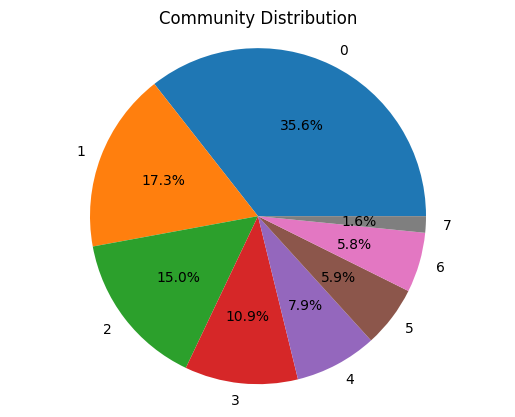

In [149]:
import os, yerbamate, ipdb
import pandas as pd
import igraph as ig
import leidenalg as la
import matplotlib.pyplot as plt

env = yerbamate.Environment()

path = os.path.join(env["plots"], "analysis", "user_hashtag_before.parquet")

df = pd.read_parquet(path)

print("Filtering DataFrame...")

hashtag_counts = df.groupby("hashtag").size().reset_index(name="counts")
top_hashtags = hashtag_counts.sort_values("counts", ascending=False).iloc[:1500]
# create a set of the top hashtags for faster lookup
top_hashtags_set = set(top_hashtags["hashtag"])

# filter the original DataFrame
df_filtered = df[df["hashtag"].isin(top_hashtags_set)]

df = df_filtered

# prrint number of unique users and hashtags
print(f"Number of unique users: {len(df['userId'].unique())}")
print(f"Number of unique hashtags: {len(df['hashtag'].unique())}")

print("Creating graph...")
# initialize a new graph
g = ig.Graph(directed=False)
# g.add_vertex(n=len(df["userId"].unique()), type="user")
# g.add_vertex(n=len(df["hashtag"].unique()), type="hashtag")
user_size = len(df["userId"].unique())


g.add_vertices(n=len(df["userId"].unique()) + len(df["hashtag"].unique()))

# set name of hashtags to be the hashtag itself
g.vs[user_size:]["name"] = df["hashtag"].unique()

# Add types for vertices
g.vs["type"] = [True if i < user_size else False for i in range(g.vcount())]


print("Added vertices...")
# map users and hashtags to unique integers
user_mapping = {user: i for i, user in enumerate(df["userId"].unique())}
hashtag_mapping = {
    hashtag: i + len(user_mapping) for i, hashtag in enumerate(df["hashtag"].unique())
}

print("Computing edges...")
 

df["user_id"] = df["userId"].map(user_mapping)
df["hashtag_id"] = df["hashtag"].map(hashtag_mapping)

# create the list of edges
edges = list(zip(df["user_id"], df["hashtag_id"]))

print("Adding edges...")

g.add_edges(edges)

weights = df["count"].values

# normalize the weights
weights = weights / weights.max()

g.es["weight"] = weights


# # add the edges with weights
# g.es["weight"] = weightsu

# # add the edges with weights
# g.es['weight'] = weights
print("Number of vertices: ", len(g.vs))
print("Number of edges: ", len(g.es))

print("Finding communities...")


# get the partition using the Leiden algorithm
import leidenalg as la

partition = la.find_partition(g, la.ModularityVertexPartition, weights= None)#g.es["weight"])

print("Number of communities: ", len(partition))

# add the partition to the graph
g.vs["partition"] = partition.membership

df['community'] =  df['user_id'].map( lambda x: g.vs[x]['partition'])

# Get the community sizes
community_sizes = partition.sizes()

# Plot the pie chart
plt.pie(community_sizes, labels=range(len(community_sizes)), autopct='%1.1f%%')
plt.title('Community Distribution')
plt.axis('equal')

# Show the chart
plt.show()

In [7]:
# loading graph

import igraph as ig
import os, yerbamate, pandas as pd

env = yerbamate.Environment()
graph_save_path = os.path.join(env['save'], 'graph', 'hashtag_communities', 'hashtag_communities_bipart.graphml')


df = pd.read_parquet(os.path.join(env['plots'], 'analysis', 'user_hashtag_before.parquet'))

hashtag_counts = df.groupby("hashtag").size().reset_index(name="counts")

top_hashtags = hashtag_counts.sort_values("counts", ascending=False).iloc[:1500]
# create a set of the top hashtags for faster lookup
top_hashtags_set = set(top_hashtags["hashtag"])

# filter the original DataFrame
df_filtered = df[df["hashtag"].isin(top_hashtags_set)]

df = df_filtered

# prrint number of unique users and hashtags
print(f"Number of unique users: {len(df['userId'].unique())}")
print(f"Number of unique hashtags: {len(df['hashtag'].unique())}")

print("Loading graph...")

g = ig.Graph.Read_GraphML(graph_save_path)

# map users and hashtags to unique integers
user_mapping = {user: i for i, user in enumerate(df["userId"].unique())}
hashtag_mapping = {
    hashtag: i + len(user_mapping) for i, hashtag in enumerate(df["hashtag"].unique())
}

print("Computing edges...")
 

df["user_id"] = df["userId"].map(user_mapping)
df["hashtag_id"] = df["hashtag"].map(hashtag_mapping)

df['community'] = df['user_id'].map( lambda x: g.vs[x]['partition'])

Number of unique users: 114838
Number of unique hashtags: 1500
Loading graph...
Computing edges...


In [51]:
# group the data by community and hashtag and sum the total usage for each combination
community_hashtag_counts = df.groupby(['community', 'hashtag'])['count'].sum().reset_index(name='total_count')

# calculate the total number of hashtag uses in each community
community_counts = df.groupby('community')['count'].sum()

# calculate the total number of uses for each hashtag
hashtag_counts = df.groupby('hashtag')['count'].sum()

# calculate the proportion of hashtag usage in each community
community_hashtag_counts['proportion_in_community'] = community_hashtag_counts.apply(lambda row: row['total_count'] / community_counts[row['community']], axis=1)

# calculate the proportion of hashtag usage in other communities
community_hashtag_counts['proportion_in_other_communities'] = community_hashtag_counts.apply(lambda row: (hashtag_counts[row['hashtag']] - row['total_count']) / (hashtag_counts.sum() - community_counts[row['community']]), axis=1)

# select the top hashtags in each community
top_hashtags = community_hashtag_counts.groupby('community').apply(lambda group: group.nlargest(200, 'total_count'))

# select the hashtags that have a high proportion of usage in the community and a low proportion of usage in other communities
exclusive_hashtags = top_hashtags[(top_hashtags['proportion_in_community'] > 0.5) & (top_hashtags['proportion_in_other_communities'] < 0.1)]


In [55]:
exclusive_hashtags = top_hashtags[(top_hashtags['proportion_in_community'] > 0.001) & (top_hashtags['proportion_in_other_communities'] < 0.0001)]

exclusive_hashtags[exclusive_hashtags['community'] == 1].head(60)

community                      hashtag  total_count  \
community                                                             
1.0       1867        1.0                    جاوید_شاه        31591   
          1865        1.0             جاوید_رضاشاه_دوم        15417   
          1866        1.0   جاوید_رضاشاه_دوم_پهلوی_سوم        15263   
          2063        1.0       ریدم_به_محمد_و_آل_محمد         9376   
          1477        1.0        ReturnToMonarchy4iran         8768   
          2352        1.0             قربانت_شوم_پهلوی         8309   
          2020        1.0             رضا_شاه_روحت_شاد         7989   
          2141        1.0                   سهیلا_حجاب         6285   
          2523        1.0          نه_به_جمهورى_اسلامى         6090   
          1801        1.0                بهنام_موسیوند         5982   
          1453        1.0                        No2IR         5819   
          2431        1.0         مرگ_بر_جمهوری_اسلامی         5819   
          2610        1.0        پهلویسم_تنها_راه_نجات         5800   
          1434        1.0                    LetUsTalk         5200   
          2084        1.0               زنده_باد_پهلوی         4678   
          2594        1.0    پادشاهی_مشروطه_برای_ایران         4334   
          2024        1.0                   رضاشاه_دوم         4273   
          1767        1.0             بازگشت_به_مشروطه         4255   
          1780        1.0                   برای_ایران         4248   
          2065        1.0                 ریدم_تو_محرم         4165   
          1748        1.0  ای_شاه_ایران_برگرد_به_ایران         4122   
          1749        1.0                ایجاد_شرمساری         4093   
          1964        1.0              دادخواهان_دربند         4042   
          2169        1.0             شاشیدم_وسط_عمامت         3973   
          2302        1.0                   فتنه۲۲بهمن         3907   
          1459        1.0                 PAHLAVl4iran         3796   
          1567        1.0                 ps752justice         3702   
          2176        1.0             شاهنشاه_روحت_شاد         3194   
          2614        1.0                   پیمان_نوین         3165   
          1408        1.0              IRGCisTerrorist         3129   
          1490        1.0         SoheilasHungerStrike         3037   
          2059        1.0                رکس_تا_متروپل         2884   
          2309        1.0                  فرقه_تبهکار         2818   
          2384        1.0               مادران_دادخواه         2791   
          1390        1.0        FreeAliAndAmirhossein         2720   
          2175        1.0              شاهنشاه_آریامهر         2593   
          2062        1.0                ریدم_به_اسلام         2583   
          1388        1.0                   FifaBanIRI         2545   
          1605        1.0                   آگاهی_جمعی         2461   
          2341        1.0                    قاسم_کتلت         2229   
          1476        1.0               ReleaseRonaghi         2189   
          2189        1.0             شهبانو_فرح_پهلوی         2174   
          1793        1.0              به_جرم_دادخواهی         2156   
          1942        1.0    خامنه‌ای_گراز_به_درد_نخور         2136   
          2438        1.0                 مرگ_بر_روسیه         2042   
          2262        1.0                    علی_یونسی         2041   
          2091        1.0                 زینب_جلالیان         2017   
          1356        1.0           ArrestMohsenRezaei         2014   
          1429        1.0                    KotletDay         1976   
          2633        1.0                         کتلت         1966   
          1411        1.0         IWillLightACandleToo         1953   
          2128        1.0                 سلام_پسمانده         1948   
          1583        1.0              آبان_ادامه_دارد         1907   
          2510        1.0                ناهید_شیرپیشه         1894   
          2468        1.0               

In [56]:
# group the data by community and hashtag and sum the total usage for each combination
community_hashtag_counts = df.groupby(['community', 'hashtag'])['count'].sum().reset_index(name='total_count')

# select the hashtags that appear in more than one community
overlapping_hashtags = community_hashtag_counts[community_hashtag_counts.duplicated('hashtag', keep=False)]

# for these overlapping hashtags, calculate the total count across all communities
overlapping_hashtags_total_counts = overlapping_hashtags.groupby('hashtag')['total_count'].sum()

# calculate the proportion of usage in each community as a measure of overlap
overlapping_hashtags['proportion_in_community'] = overlapping_hashtags.apply(lambda row: row['total_count'] / overlapping_hashtags_total_counts[row['hashtag']], axis=1)

# sort by hashtag and proportion to see the distribution across communities
overlapping_hashtags.sort_values(['hashtag', 'proportion_in_community'], ascending=[True, False], inplace=True)

overlapping_hashtags.head(60)

,community,hashtag,total_count,proportion_in_community
2678,2.0,1988Massacre,5238,0.619955
5372,4.0,1988Massacre,2970,0.351521
1345,1.0,1988Massacre,240,0.028406
4065,3.0,1988Massacre,1,0.000118
7902,6.0,9YearsWithBTS,2707,0.998893
4066,3.0,9YearsWithBTS,3,0.001107
7903,6.0,ARMY,17741,0.995511
5373,4.0,ARMY,56,0.003142
6769,5.0,ARMY,8,0.000449
2679,2.0,ARMY,7,0.000393


In [63]:
# group by hashtag and get the max proportion for each
max_proportion_per_hashtag = overlapping_hashtags.groupby('hashtag')['proportion_in_community'].max()

# filter to get the hashtags where the max proportion is less than 0.5
non_dominant_hashtags = max_proportion_per_hashtag[max_proportion_per_hashtag < 0.5]

# filter the overlapping_hashtags dataframe to only include these non-dominant hashtags
overlapping_non_dominant = overlapping_hashtags[overlapping_hashtags['hashtag'].isin(non_dominant_hashtags.index)]

# sort and display
overlapping_non_dominant.sort_values(['hashtag', 'proportion_in_community'], ascending=[True, False])

# sort by total count to see the most popular hashtags
overlapping_non_dominant.sort_values('total_count', ascending=False)

# drop duplicate hashtags, and make portion_in_community an array
overlapping_non_dominant = overlapping_non_dominant.groupby('hashtag').agg({
    'community': lambda x: list(x),
    'proportion_in_community': lambda x: list(x),
    'total_count': 'sum'  # or 'first' or 'mean' or whatever aggregation function you want to use for total_count
}).reset_index()

overlapping_non_dominant.head(60)

,hashtag,community,proportion_in_community,total_count
0,Abadan,"[4.0, 1.0, 2.0, 0.0, 5.0, 3.0, 6.0]","[0.4788787998420845, 0.33438610343466246, 0.16...",2533
1,IranProtests,"[2.0, 4.0, 1.0, 0.0, 5.0, 3.0, 7.0]","[0.42914285714285716, 0.35482706766917294, 0.2...",33250
2,Iran_in_reality,"[1.0, 3.0, 2.0, 4.0, 0.0, 5.0]","[0.46266115300413524, 0.31427876429092677, 0.1...",4111
3,MeToo,"[4.0, 3.0, 2.0, 0.0, 1.0, 6.0, 5.0, 7.0]","[0.4192574705704799, 0.23030485964382735, 0.11...",3313
4,NoWar,"[4.0, 3.0, 1.0, 2.0, 0.0, 5.0, 6.0, 7.0]","[0.42264288314524934, 0.31416090280305786, 0.0...",2747
5,Nowruz,"[4.0, 2.0, 1.0, 0.0, 5.0, 3.0, 6.0, 7.0]","[0.47395171537484115, 0.2480304955527319, 0.11...",3935
6,PersianGulf,"[1.0, 2.0, 4.0, 3.0, 0.0, 5.0, 7.0]","[0.3645621181262729, 0.285132382892057, 0.2138...",982
7,RamadanMubarak,"[3.0, 4.0, 2.0, 0.0, 6.0, 1.0, 5.0]","[0.4307692307692308, 0.3757085020242915, 0.146...",1235
8,RealMadrid,"[0.0, 4.0, 2.0, 1.0, 5.0, 3.0, 6.0]","[0.46284501061571126, 0.23779193205944799, 0.1...",942
9,SalmanRushdie,"[4.0, 1.0, 2.0, 3.0, 0.0, 6.0, 5.0]","[0.45029736618521665, 0.3370150099122062, 0.18...",3531


In [66]:

# remove this hashtags, and do the network analysis again

# get list of non-dominant hashtags
non_dominant_hashtags = overlapping_non_dominant['hashtag'].tolist()

# map to their ids
non_dominant_ids = df[df['hashtag'].isin(non_dominant_hashtags)]['hashtag_id'].unique().tolist()

non_dominant_ids = [id for id in non_dominant_ids if id in g.vs.indices]
# delete if its in the vertex list

# delete the vertices
g.delete_vertices(non_dominant_ids)

import leidenalg as la

# get the partition using the Leiden algorithm
partition = la.find_partition(g, la.ModularityVertexPartition)

print("Number of communities: ", len(partition))

# add the partition to the graph
g.vs["partition"] = partition.membership

df['community'] =  df['user_id'].map( lambda x: g.vs[x]['partition'] if x < len(g.vs) else None)

# Get the community sizes
community_sizes = partition.sizes()

# Plot the pie chart
plt.pie(community_sizes, labels=range(len(community_sizes)), autopct='%1.1f%%')
plt.title('Community Distribution')
plt.axis('equal')

# Show the chart
plt.show()



InternalError: Error at src/graph/iterators.c:828: Cannot create iterator, invalid vertex ID. -- Invalid vertex ID

Community distribution statistics: 
[41399, 20137, 17500, 12669, 9214, 6869, 6709, 1841]


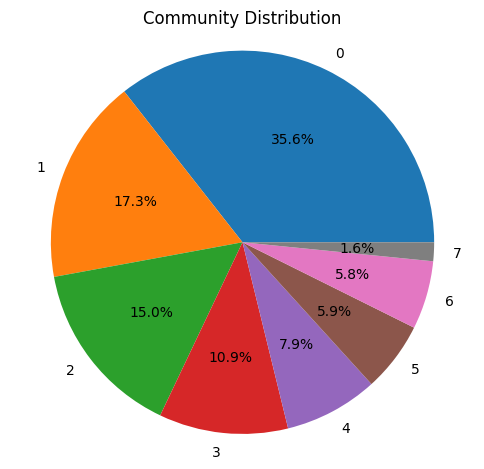

In [172]:
# Plot the pie chart
plt.pie(community_sizes, labels=range(len(community_sizes)), autopct='%1.1f%%')
plt.title('Community Distribution')
plt.axis('equal')

save_path_pie = os.path.join(env["plots"], "analysis", "community", "community_pie.png")

if not os.path.exists(os.path.dirname(save_path_pie)):
    os.makedirs(os.path.dirname(save_path_pie))

# tight_layout() adjusts the subplot params so that the subplot(s) fits in to the figure area.
plt.tight_layout()

# remove the extra white space on the right side of the plot
plt.subplots_adjust(right=0.75)

plt.savefig(save_path_pie)

# print distribution statistics

print("Community distribution statistics: ")
print(community_sizes)

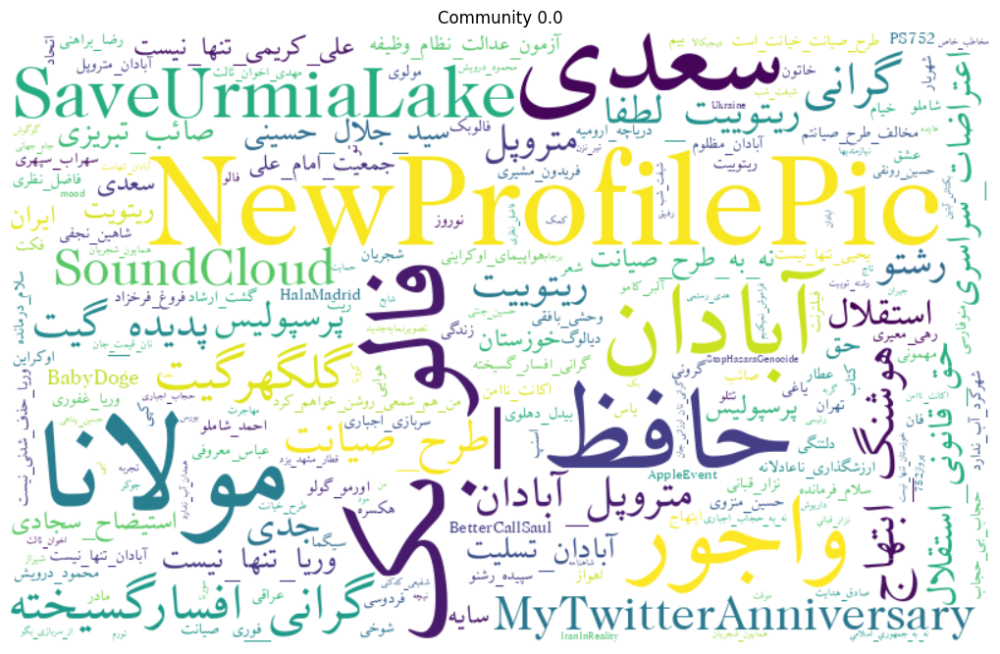

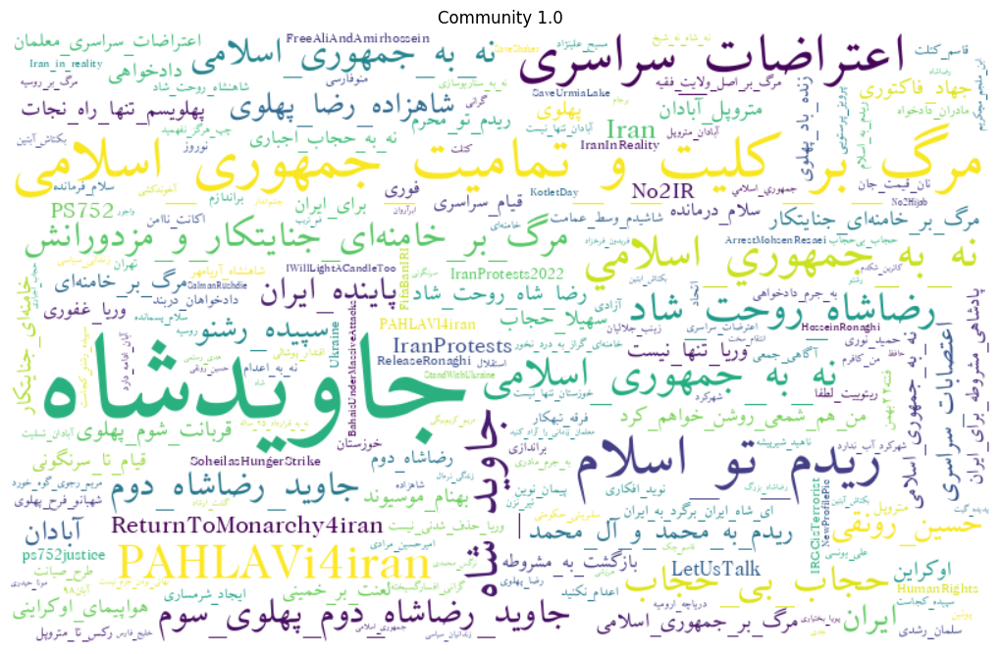

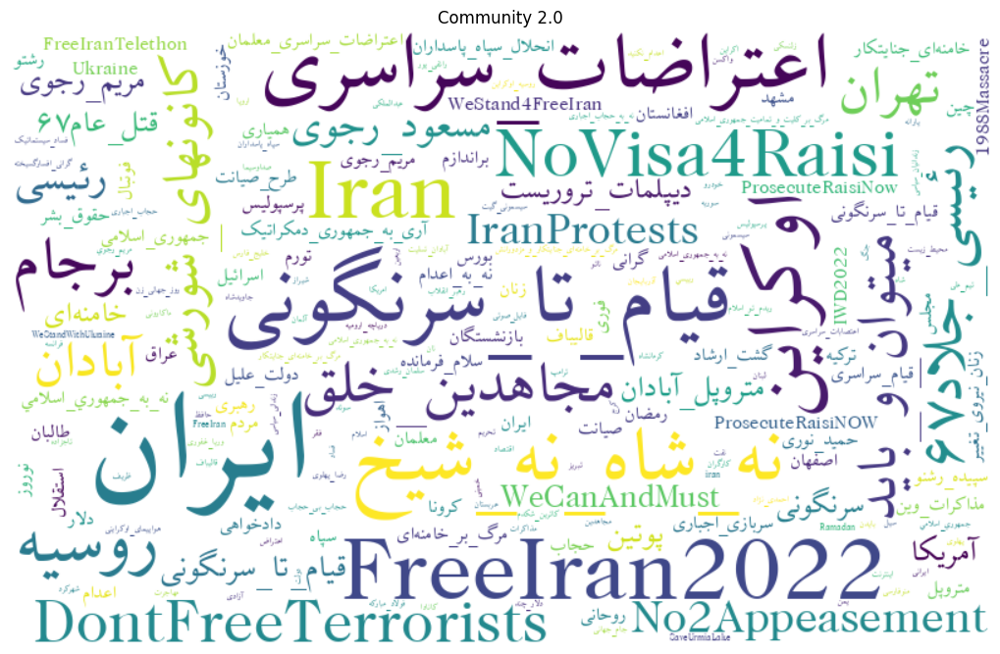

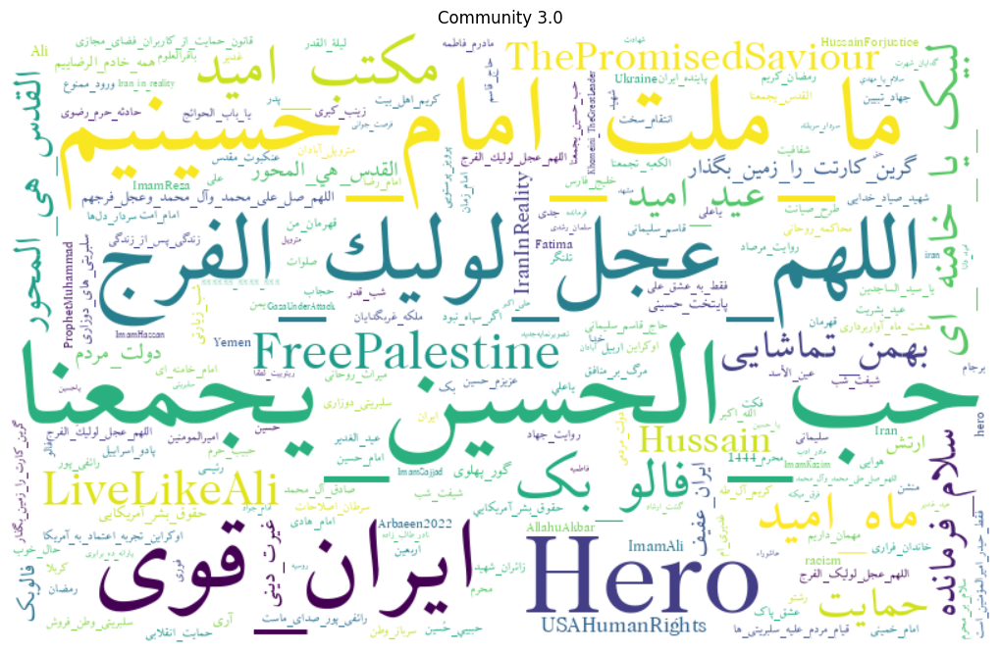

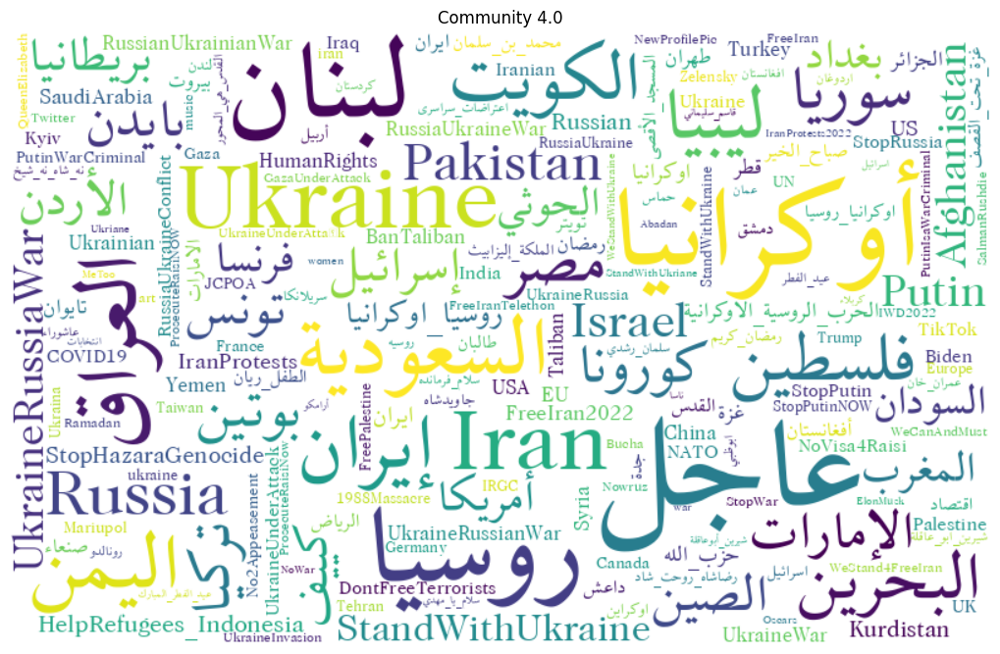

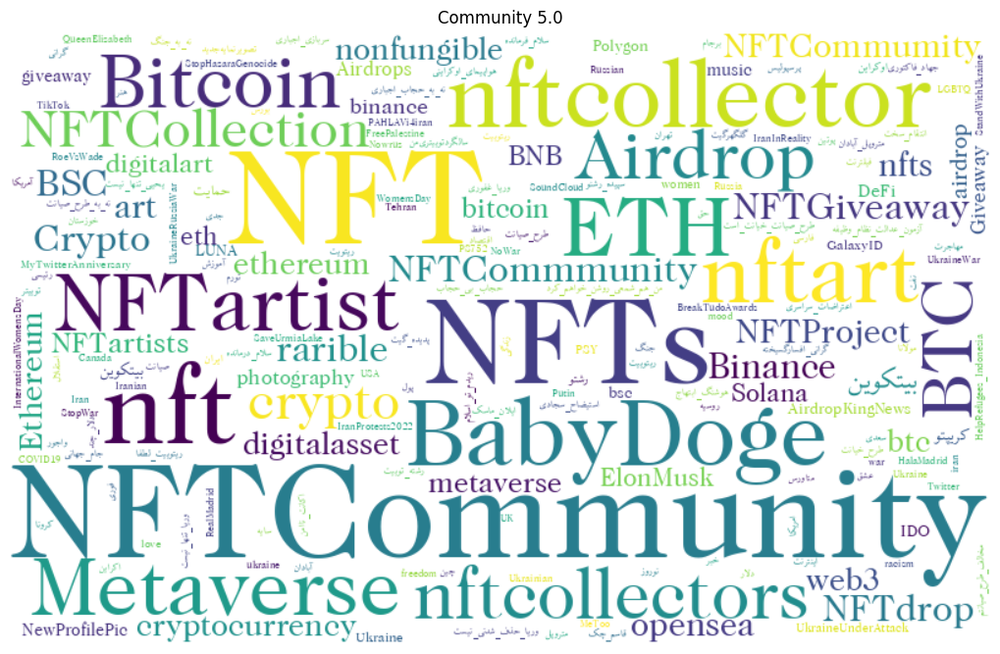

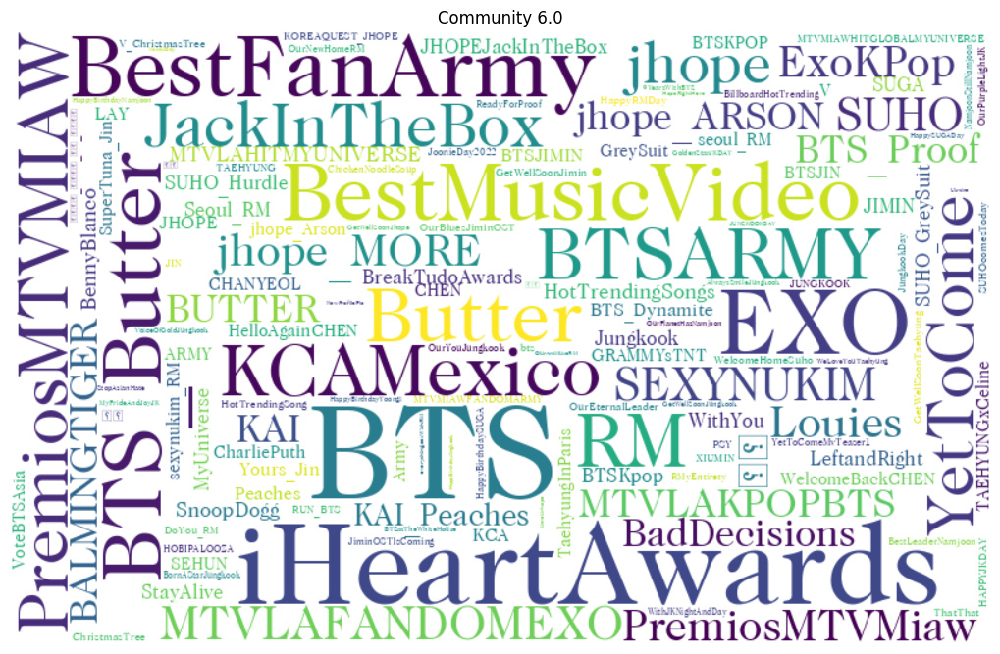

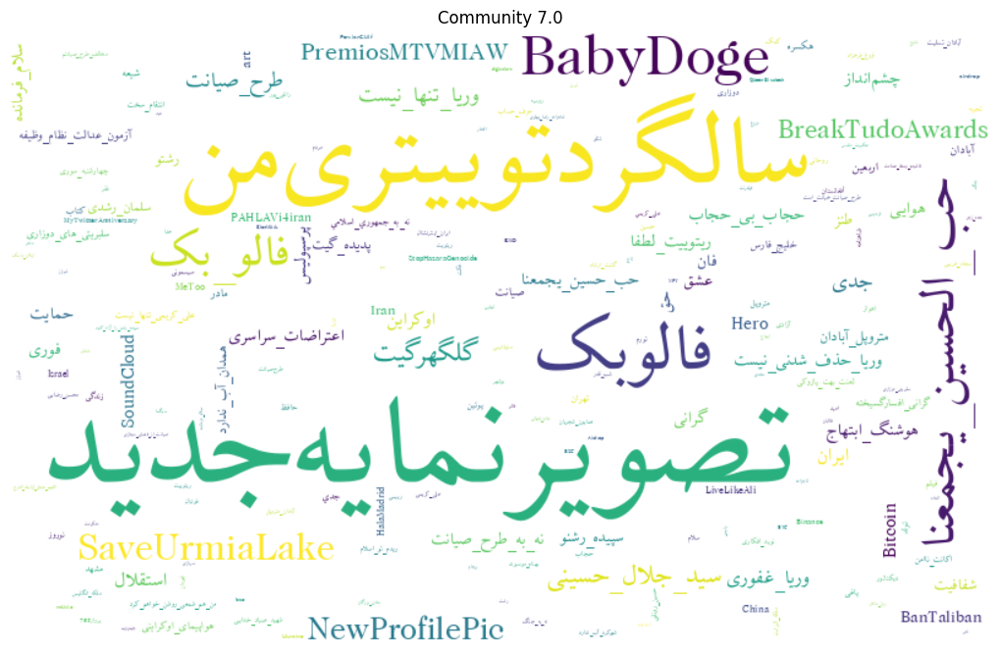

In [35]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import matplotlib

matplotlib.rcParams["axes.unicode_minus"] = False
from bidi.algorithm import get_display
import arabic_reshaper

# assuming `df` is your DataFrame and it has a 'community' column
for community in sorted(df["community"].unique()):
    subset = df[df["community"] == community]
    # print(subset.columns)
    # #freq = subset.groupby("hashtag").count() 
    # # text = get_display(arabic_reshaper.reshape(text))
    # print(subset.head())
    # if subset.empty:
    #     print(f"No hashtags for community {community}. Skipping...")
    #     continue

    freq = subset.groupby("hashtag")["count"].sum()
    # print(freq)
    wordcloud = WordCloud(
        font_path="/usr/share/fonts/TTF/XB-Zar-Regular.ttf",
        width=800,
        height=500,
        random_state=21,
        max_font_size=110,
        background_color="white",
    ).generate_from_frequencies(freq)

    plt.figure(figsize=(10, 7))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"Community {community}")
    # plt.show()
    save_cloud_path = os.path.join( env["plots"], "analysis", "community", f"community_{community}.png")

    if not os.path.exists(os.path.dirname(save_cloud_path)):
        os.makedirs(os.path.dirname(save_cloud_path))

    # tight_layout() adjusts the subplot params so that the subplot(s) fits in to the figure area.
    plt.tight_layout()

    # remove the extra white space on the right side of the plot
    plt.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0, hspace=0)
    plt.show()
    #plt.savefig(save_cloud_path)

In [189]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import matplotlib

matplotlib.rcParams["axes.unicode_minus"] = False
from bidi.algorithm import get_display
import arabic_reshaper

# assuming `df` is your DataFrame and it has a 'community' column
for community in sorted(df["community"].unique()):
    subset = df[df["community"] == community]
    # print(subset.columns)
    # #freq = subset.groupby("hashtag").count() 
    # # text = get_display(arabic_reshaper.reshape(text))
    # print(subset.head())
    # if subset.empty:
    #     print(f"No hashtags for community {community}. Skipping...")
    #     continue

    freq = subset.groupby("hashtag")["count"].sum()
    # print top 20 hashtags and their frequencies
    print(f"Community {community}")
    #print(freq.sort_values(ascending=False).head(200).iloc[::2])
    top_200 = freq.sort_values(ascending=False).head(200)
    for hashtag, count in top_200.items():
        print(hashtag, count)    

Community 0
مولانا 16785
NewProfilePic 15267
حافظ 14735
سعدی 14478
فالو_بک 14156
آبادان 11192
واجور 10572
SaveUrmiaLake 9773
گرانی_افسارگسیخته 8879
گلگهرگیت 8419
SoundCloud 7975
گرانی 7623
MyTwitterAnniversary 6706
هوشنگ_ابتهاج 6548
متروپل_آبادان 6363
طرح_صیانت 6271
پدیده_گیت 5653
رشتو 5457
ریتوییت 5286
ريتوييت_لطفا 5213
جدی 4963
متروپل 4913
استقلال 4732
پرسپولیس 4505
حق_قانونی_استقلال 4410
اعتراضات_سراسری 4401
سید_جلال_حسینی 3930
آبادان_تسلیت 3863
وریا_تنها_نیست 3834
صائب_تبریزی 3738
نه_به_طرح_صیانت 3521
ایران 3455
حق 3400
ريتويت 3387
سایه 3353
علی_کریمی_تنها_نیست 3225
خوزستان 3196
سعدى 3188
پرسپوليس 3127
استیضاح_سجادی 3020
جمعیت_امام_علی 2955
آزمون_عدالت_نظام_وظیفه 2916
BabyDoge 2846
من_هم_شمعی_روشن_خواهم_کرد 2792
ارزشگذاری_ناعادلانه 2654
کپی 2623
فروغ_فرخزاد 2610
عباس_معروفی 2583
شهریار 2535
فکت 2483
فاضل_نظری 2469
ريتوييت 2451
آبادان_متروپل 2339
سپیده_رشنو 2332
حسین_منزوی 2310
HalaMadrid 2183
آبادان_تنها_نیست 2093
یاغی 2085
خیام 2042
گرانی_افسار_گسیخته 2013
PS752 1994
هواپیمای_اوکر

In [169]:
graph_save_path = os.path.join(env['save'], 'graph', 'hashtag_communities')

# set name of hashtags to be the hashtag itself
g.vs[user_size:]["label"] = df["hashtag"].unique()

# set label of others to ''
g.vs[:user_size]["label"] = ' ‌'

if not os.path.exists(graph_save_path):
    os.makedirs(graph_save_path)

g.save(os.path.join(graph_save_path, 'hashtag_communities_bipart.graphml'))


In [3]:
translation_cache = {}  # Translation cache to store previously translated hashtags

# save the translation cache as json
import json

path = os.path.join(env["save"], "translation_cache.json")

translation_cache = json.load(open(path, "r"))


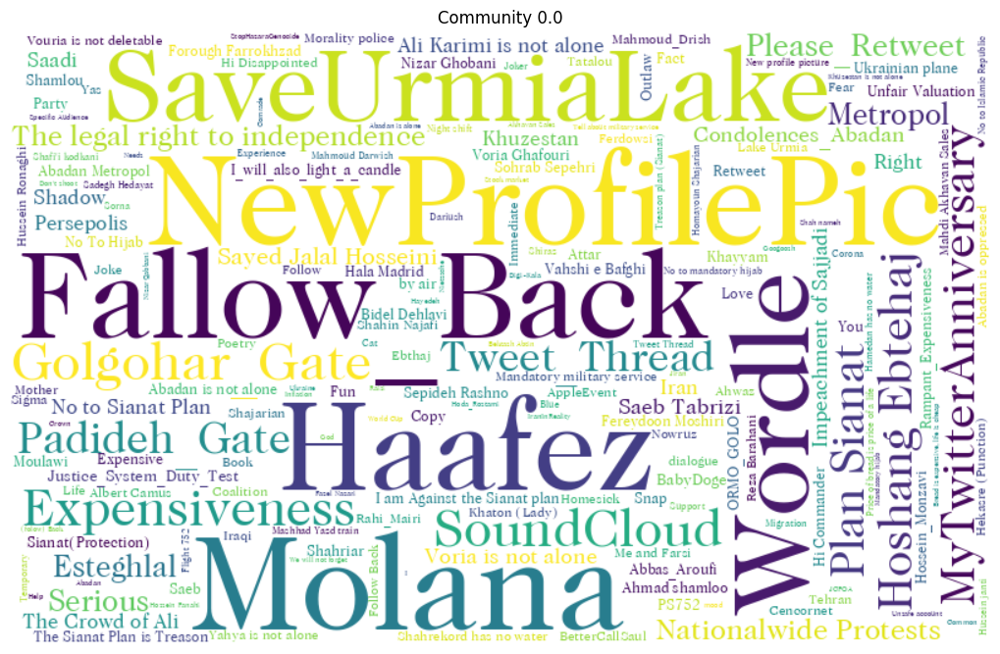

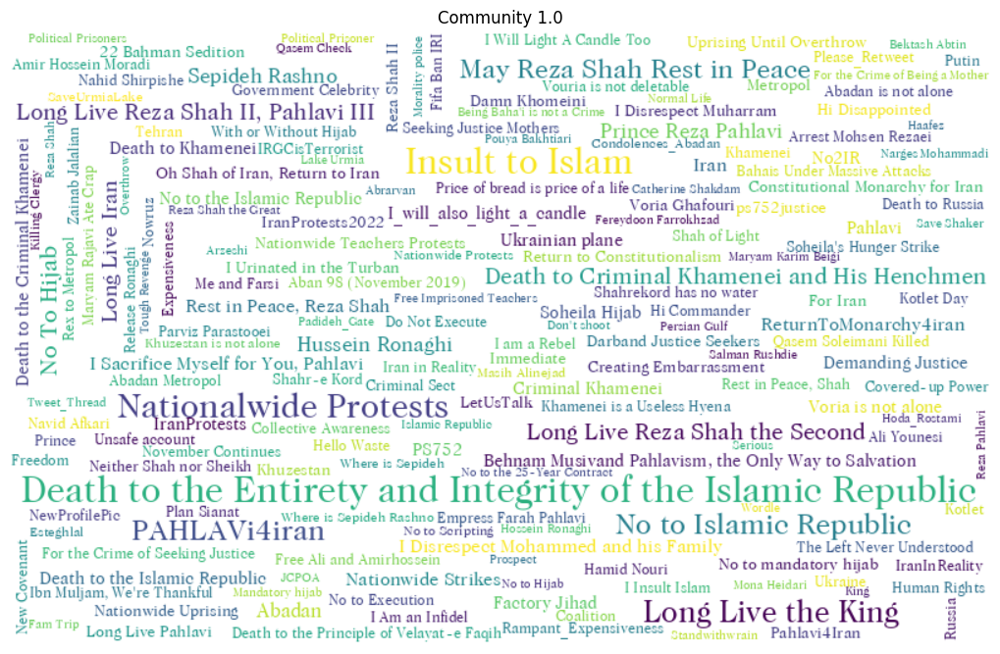

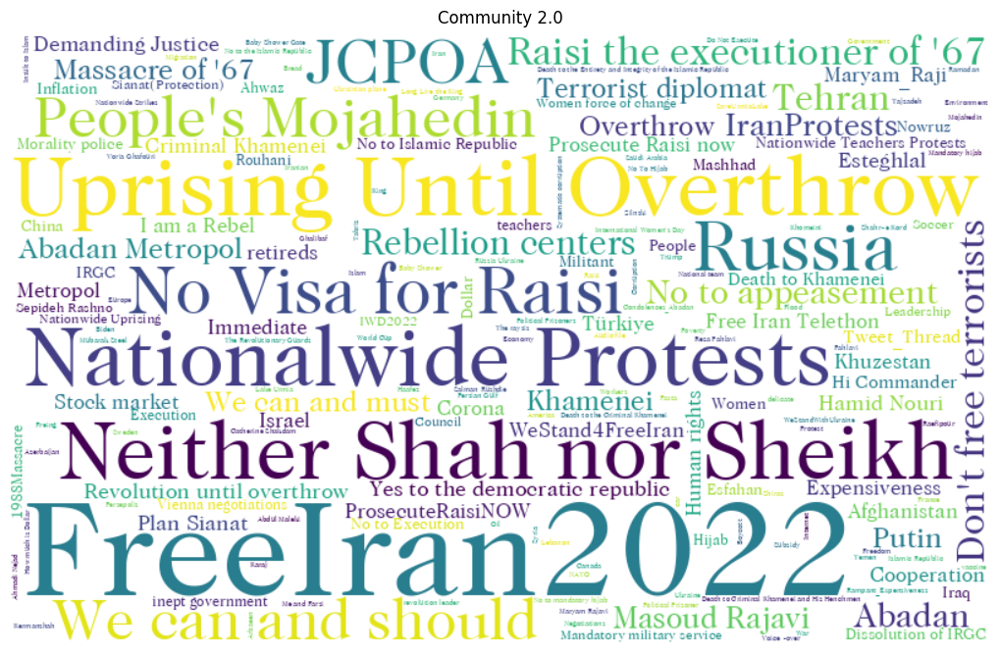

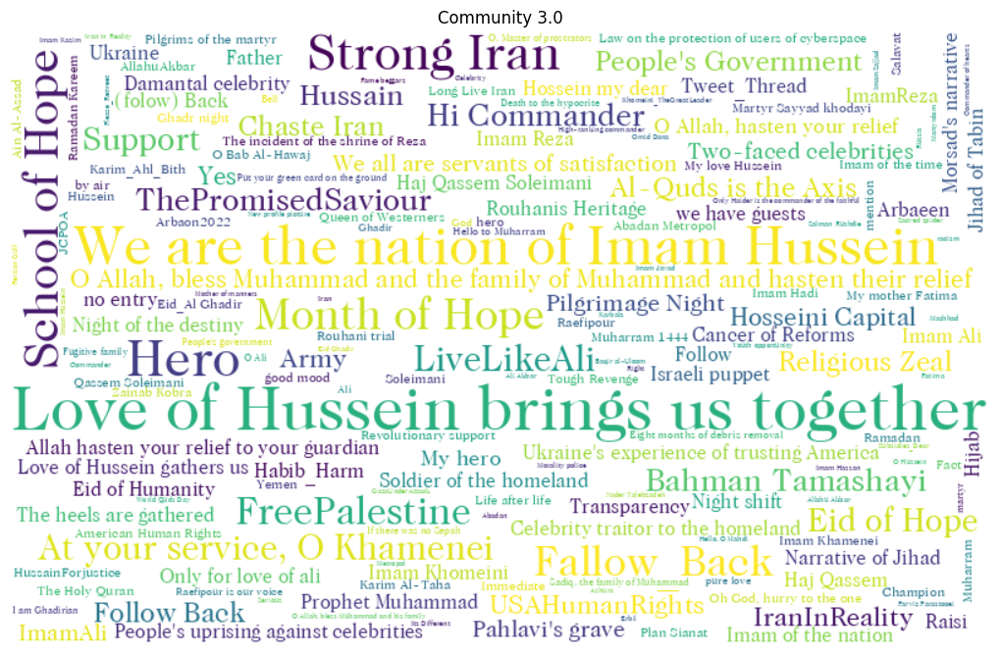

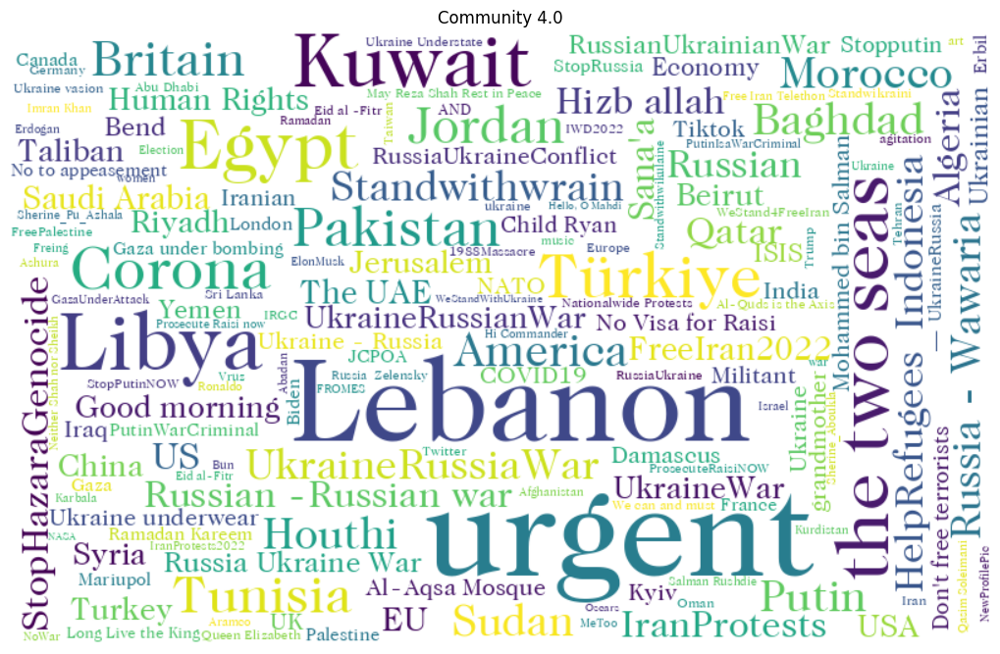

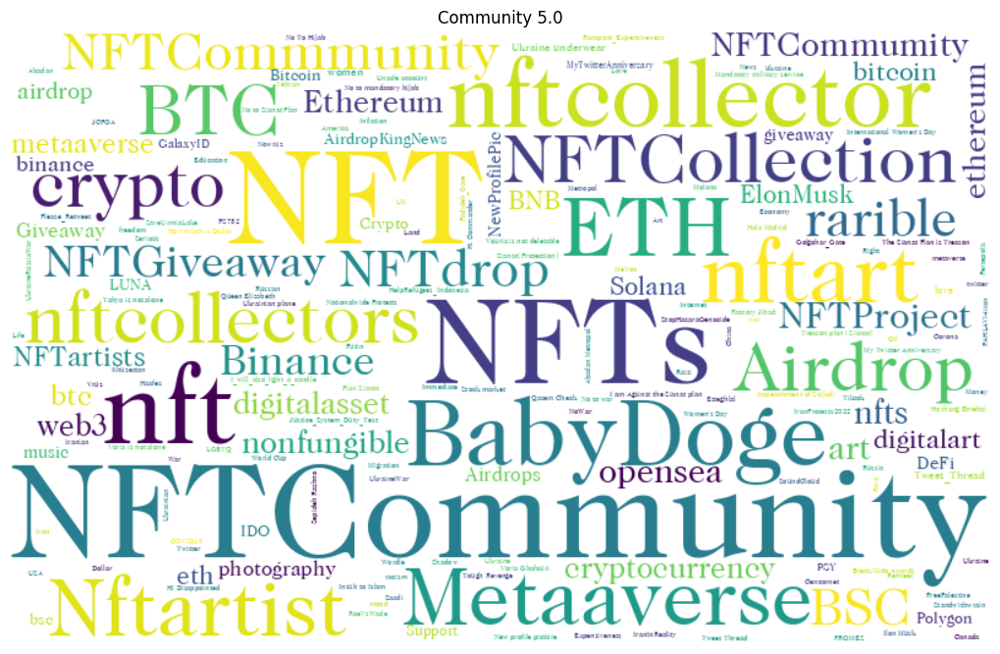

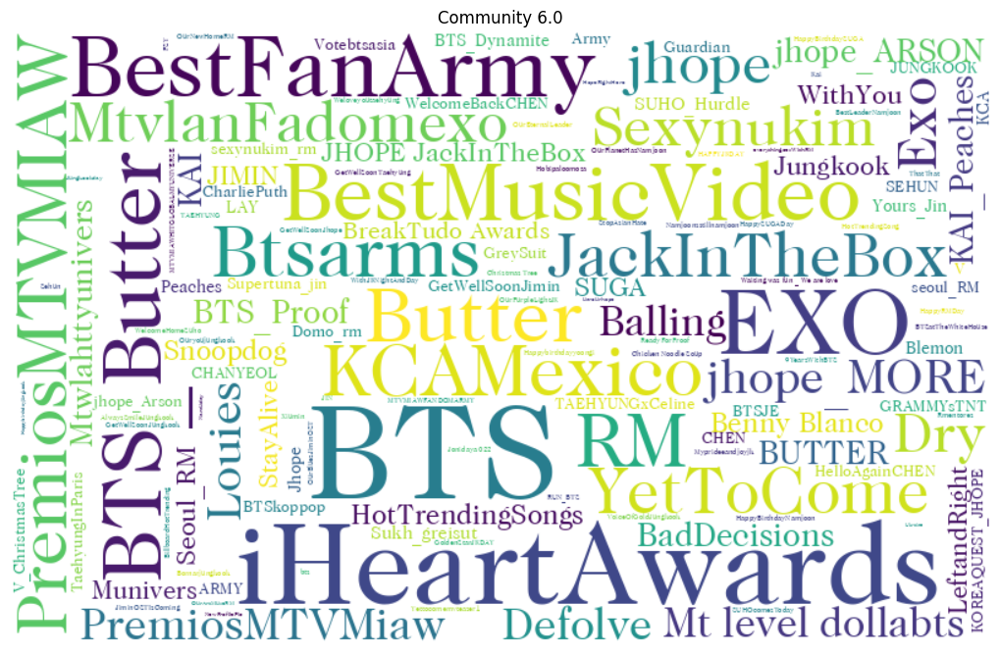

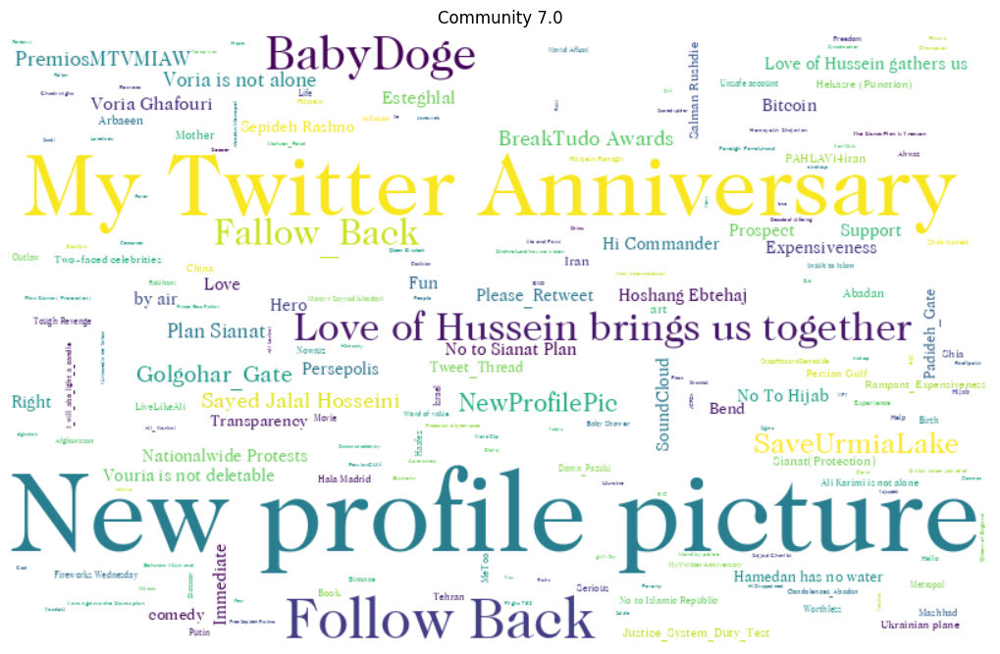

In [4]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import matplotlib
from bidi.algorithm import get_display
import arabic_reshaper
from googletrans import Translator
import requests
import time
from httpx import Timeout

translator = Translator(service_urls=['translate.google.com'], timeout=Timeout(5))

matplotlib.rcParams["axes.unicode_minus"] = False

# save top 20 hashtags for each community
top_twenty = {}

# assuming `df` is your DataFrame and it has a 'community' column
for community in sorted(df["community"].unique()):
    subset = df[df["community"] == community]

    freq = subset.groupby("hashtag")["count"].sum()

    # Select the top 200 hashtags based on count
    top_freq = freq.nlargest(200)



    translator = Translator(service_urls=['translate.google.com'], timeout=Timeout(5))

    # Translate the top hashtags from Arabic to English
    translated_freq = {}
    for hashtag, count in top_freq.items():
        if hashtag in translation_cache:
            translated_hashtag = translation_cache[hashtag]
        else:
            translated_hashtag = None
            while translated_hashtag is None:
                try:
                    translation = translator.translate(hashtag, dest='en', src='auto')
                    if hasattr(translation, 'text') and translation.text is not None:
                        translated_hashtag = translation.text
                        translation_cache[hashtag] = translated_hashtag
                except:
                    time.sleep(5)  # Wait for 5 seconds before retrying
                    continue

        translated_freq[translated_hashtag] = count

    # save top twenty hashtags for each community and translation 
    top_twenty[community] = translated_freq

    wordcloud = WordCloud(
        font_path="/usr/share/fonts/TTF/XB-Zar-Regular.ttf",
        width=800,
        height=500,
        random_state=21,
        max_font_size=110,
        background_color="white",
    ).generate_from_frequencies(translated_freq)

    plt.figure(figsize=(10, 7))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"Community {community}")

    save_cloud_path = os.path.join(env["plots"], "analysis", "community", f"community_{community}_en.png")

    if not os.path.exists(os.path.dirname(save_cloud_path)):
        os.makedirs(os.path.dirname(save_cloud_path))

    plt.tight_layout()
    plt.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0, hspace=0)
    
    plt.savefig(save_cloud_path)

# save top 100 for as json



In [18]:
import json

path = os.path.join(env["save"], "analysis", "community", "top_twenty.json")

top_twenty = {}
# for each language save top 20 hashtags for each community

for community in sorted(df["community"].unique()):
    subset = df[df["community"] == community]

    freq = subset.groupby("hashtag")["count"].sum()

    # Select the top 200 hashtags based on count
    top_freq = freq.nlargest(200)
    # sort by count
    top_freq = top_freq.sort_values(ascending=False)#.head(20)

    for hashtag, count in top_freq.items():

        top_freq[hashtag] = {
            "count": count,
            "en": translation_cache[hashtag],
        }
    
    # sort by count
    
    # save top twenty hashtags for each community and translation
    top_twenty[community] = top_freq.to_dict()


if not os.path.exists(os.path.dirname(path)):
    os.makedirs(os.path.dirname(path))

with open(path, "w") as f:
    json.dump(top_twenty, f, indent=4, ensure_ascii=False)

In [194]:
translation_cache

# save the translation cache as json
import json

path = os.path.join(env["save"], "translation_cache.json")
with open(path, "w") as f:
    json.dump(translation_cache, f, ensure_ascii=False, indent=4)

# 

In [14]:
degree = g.degree()

# filter degree of hashtag nodes

user_size = len(g.vs) - len(df["hashtag"].unique())

hashtag_degree = degree[user_size:]


# print hashtag and degree
for hashtag, degree in zip(df["hashtag"].unique(), hashtag_degree):
    print(hashtag, degree)



QueenElizabeth 1425
Israel 1102
Trump 690
Afghanistan 1622
المغرب 467
افغانستان 2281
ملکه_الیزابت 1351
سوريا 827
اوكرانيا 522
بيروت 426
اليمن 1024
رمضان_مبارك 726
بايدن 1082
حماس 534
ايران 1505
أربيل 942
بريطانيا 513
عيد_الفطر 646
صنعاء 539
العراق 1359
إيران 926
فرنسا 472
GazaUnderAttack 654
انتخابات 557
تركيا 692
لبنان 1677
السعودية 1023
رمضان 2656
روسيا 889
المسجد_الأقصى 686
تايوان 593
انقلاب 1445
أمريكا 992
جدة 415
مصر 1016
دمشق 483
عمران_خان 429
شيرين_أبوعاقلة 641
الجزائر 458
الامارات 658
COVID19 865
حزب_الله 950
AppleEvent 519
سلام_يا_مهدي 608
الكويت 644
ElonMusk 1073
رونالدو 460
بيتكوين 752
سلمان_رشدي 545
قاسم_سليماني 1440
كردستان 425
crypto 779
الله 417
عمان 480
Bitcoin 1477
عاجل 709
ليبيا 470
SaudiArabia 489
France 553
RoeVsWade 420
UN 588
UkraineWar 1279
لندن 656
انفجار 506
القدس 1052
تويتر 539
Turkey 697
سريلانكا 410
طهران 593
معلم 1145
اعتراض 646
الحرب_الروسية_الاوكرانية 415
الصين 562
photography 508
InternationalWomensDay 631
كورونا 519
Yemen 1193
فلسطين 1564
كييف 527
كربلا

In [197]:

degree = g.degree()
print("Degree Centrality: ", degree)

# Betweenness centrality
betweenness = g.betweenness()
print("Betweenness Centrality: ", betweenness)

# Eigenvector centrality
eigenvector = g.eigenvector_centrality()
print("Eigenvector Centrality: ", eigenvector)

Degree Centrality:  [54, 65, 101, 96, 85, 72, 30, 89, 106, 91, 51, 20, 116, 81, 55, 108, 55, 86, 81, 46, 81, 103, 28, 89, 105, 92, 89, 198, 119, 19, 67, 96, 88, 68, 87, 34, 37, 46, 34, 112, 125, 93, 30, 72, 131, 20, 86, 105, 116, 9, 15, 76, 36, 71, 84, 71, 70, 97, 47, 29, 113, 84, 123, 13, 23, 111, 142, 41, 99, 121, 37, 32, 168, 12, 97, 51, 34, 85, 61, 16, 83, 484, 63, 59, 142, 348, 65, 40, 80, 49, 16, 22, 134, 69, 21, 60, 47, 294, 36, 71, 21, 72, 34, 45, 26, 72, 128, 60, 153, 29, 83, 16, 47, 104, 35, 58, 56, 74, 38, 56, 48, 84, 206, 490, 123, 72, 40, 4, 18, 85, 29, 47, 103, 107, 34, 90, 28, 20, 53, 16, 55, 23, 17, 32, 69, 94, 49, 129, 61, 15, 29, 144, 62, 68, 17, 35, 89, 42, 172, 103, 140, 23, 90, 26, 31, 48, 17, 120, 17, 117, 30, 64, 107, 152, 78, 18, 27, 39, 47, 91, 35, 260, 81, 58, 76, 346, 48, 7, 6, 89, 80, 45, 76, 4, 89, 28, 37, 55, 40, 90, 76, 76, 17, 80, 122, 267, 134, 131, 86, 76, 58, 74, 33, 41, 45, 32, 371, 262, 75, 120, 14, 24, 46, 30, 3, 91, 153, 25, 31, 139, 15, 433, 70, 

KeyboardInterrupt: 

In [33]:
sample_size = 4500

# 2. Sample nodes
# Group nodes by community
groups = df.groupby('community')

# Sample from each group
sampled_nodes = groups.apply(lambda x: x.sample(n=int((x['userId'].nunique()/df['userId'].nunique())*sample_size)))

# Get the unique sampled userIds
sampled_ids = sampled_nodes['userId'].unique()

# 3. Create a subgraph
# Get the vertex indices corresponding to the sampled user Ids
vertex_indices = [g.vs.find(name=str(i)).index for i in sampled_ids if str(i) in g.vs['name']]

# Create a subgraph
subgraph = g.subgraph(vertex_indices)

# Plot the subgraph


In [34]:
import networkx as nx
from pyvis.network import Network


# Convert igraph to networkx
G_nx = ig.Graph.to_networkx(subgraph)

# Create a pyvis network
G_pyvis = Network(notebook=True)
G_pyvis.from_nx(G_nx)

# Show the network
G_pyvis.show("graph.html")

graph.html
